# SAILS

## (1) Datos de Glottolog

In [4]:
## usamos pandas para leer los datos

import pandas as pd

In [5]:
## diccionario iso:glottocode
## https://glottolog.org/meta/downloads

langs = pd.read_csv('languages_and_dialects_geo.csv',sep=',')

In [6]:
## filtramos por lenguas de las Américas

macroarea = langs[['glottocode','macroarea']]
macroarea = macroarea.dropna()

In [7]:
## creamos un diccionario iso:macroarea
## filtramos por macroarea 'South America' y 'North America'

macroarea = dict(zip(macroarea['glottocode'], macroarea['macroarea']))
macroarea = {language:macroarea[language] for language in macroarea.keys() if macroarea[language] in ['South America','North America']}

In [8]:
print(len(macroarea))

2382


In [9]:
## familias de las Américas

In [10]:
## miramos languoids

languoid = pd.read_csv('languoid.csv',sep=',')

In [11]:
languoid

,id,family_id,parent_id,name,bookkeeping,level,latitude,longitude,iso639P3code,description,markup_description,child_family_count,child_language_count,child_dialect_count,country_ids
0,3adt1234,afro1255,nort3292,3Ad-Tekles,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
1,aala1237,aust1307,ramo1244,Aalawa,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
2,aant1238,nucl1709,nort2920,Aantantara,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
3,aari1238,sout2845,ahkk1235,Aari-Gayil,False,family,NaN,NaN,aiz,NaN,NaN,0,2,0,NaN
4,aari1239,sout2845,aari1238,Aari,False,language,5.95034,36.5721,aiw,NaN,NaN,0,0,0,ET
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25434,zuti1239,tupi1275,guaj1255,Guajajára of Zutiua,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
25435,zuwa1238,koia1260,omie1241,Zuwadza,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
25436,zwal1238,atla1278,shal1242,Zwall,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
25437,zyph1238,sino1245,nucl1757,Zyphe,False,language,22.52400,93.2640,zyp,NaN,NaN,0,0,2,IN MM


In [12]:
## filtramos id:family_id (family)

location = languoid[['id','latitude','longitude']]
location = location.dropna()

In [13]:
location_lat = dict(zip(location['id'],location['latitude']))
location_lon = dict(zip(location['id'],location['longitude']))

In [14]:
location = {key:[location_lat[key],location_lon[key]] for key in location_lat.keys()}

In [15]:
len(location)

8437

In [16]:
## filtramos id:family_id (family)

id_family = languoid[['id','family_id']]
id_family = id_family.dropna()

In [17]:
## filtramos id:parent_id (genus)

glotto_iso = languoid[['id','iso639P3code']]
glotto_iso = glotto_iso.dropna()

In [18]:
## transformamos a diccionario

glotto_iso = dict(zip(glotto_iso['id'], glotto_iso['iso639P3code']))
glotto_iso = {language:glotto_iso[language] for language in glotto_iso.keys() if language in macroarea.keys()}

In [19]:
## transformamos a diccionario

id_family = dict(zip(id_family['id'], id_family['family_id']))
ID_family = {language:id_family[language] for language in id_family.keys() if  language in macroarea.keys()}

In [20]:
len(id_family)

25014

In [21]:
id_family['huil1244']

'arau1255'

## (2) Datos de SAILS

In [22]:
## rasgos

features_sails = pd.read_csv('features_sails.csv',sep=',')

In [23]:
features_sails=features_sails.rename(columns={'Unnamed: 0': 'features'})

In [24]:
len(list(features_sails.columns[1:]))

167

In [25]:
features=list(features_sails['features'])

In [26]:
features_pred = {}

for language in list(features_sails.columns[1:]):
    features_pred[language]=dict(zip(features,list(features_sails[language])))

In [27]:
for language in features_pred:
    D=features_pred[language]
    D={k: v for k, v in D.items() if pd.Series(v).notna().all()}
    D={key:D[key] for key in D.keys() if D[key][-2:]!='NK' and D[key][-2:]!='NA' and D[key].startswith('ARGEX5')==True} ## estructura argumental
    #D={key:D[key] for key in D.keys() if D[key][-2:]!='NK' and D[key].startswith('TAME')==True} ## tame
    #D={key:D[key] for key in D.keys() if D[key][-2:]!='NK' and D[key].startswith('AND')==True and D[key].startswith('ARW')==False}## todo sin arawak + andean specific
    
    features_pred[language]=D

In [28]:
print(len(features_pred))

167


In [29]:
pd.DataFrame(list(features_pred['mapu1245'].items()),columns=['rasgos', 'valores de rasgos'])

,rasgos,valores de rasgos
0,ARGEX5-1,ARGEX5-1-C
1,ARGEX5-2,ARGEX5-2-C
2,ARGEX5-3,ARGEX5-3-C
3,ARGEX5-4,ARGEX5-4-C
4,ARGEX5-5,ARGEX5-5-D
5,ARGEX5-6,ARGEX5-6-C
6,ARGEX5-7,ARGEX5-7-C
7,ARGEX5-8,ARGEX5-8-C
8,ARGEX5-9,ARGEX5-9-B


In [30]:
features_pred['mapu1245']

{'ARGEX5-1': 'ARGEX5-1-C',
 'ARGEX5-2': 'ARGEX5-2-C',
 'ARGEX5-3': 'ARGEX5-3-C',
 'ARGEX5-4': 'ARGEX5-4-C',
 'ARGEX5-5': 'ARGEX5-5-D',
 'ARGEX5-6': 'ARGEX5-6-C',
 'ARGEX5-7': 'ARGEX5-7-C',
 'ARGEX5-8': 'ARGEX5-8-C',
 'ARGEX5-9': 'ARGEX5-9-B'}

In [31]:
features_pred = {key:features_pred[key] for key in features_pred.keys() if len(features_pred[key])==9}# and key in id_family.keys()}

In [32]:
print(len(features_pred))

88


In [33]:
for language in features_pred.keys():
    print(language,len(features_pred[language]))

agua1253 9
yane1238 9
apur1254 9
apal1257 9
arhu1242 9
mapu1245 9
karo1305 9
araw1276 9
awet1244 9
cent2142 9
bora1263 9
boro1282 9
baur1253 9
chip1262 9
mose1249 9
cavi1250 9
chay1248 9
chol1284 9
coca1259 9
colo1256 9
cube1242 9
desa1247 9
emer1243 9
nort2972 9
guat1253 9
hixk1239 9
inga1252 9
iton1250 9
jama1261 9
hupd1244 9
juru1256 9
kama1373 9
kari1311 9
daww1239 9
awac1239 9
kano1245 9
leco1242 9
lako1248 9
sate1243 9
mats1244 9
moco1246 9
maku1278 9
wich1262 9
mund1330 9
movi1243 9
moch1259 9
pare1272 9
wari1268 9
paez1247 9
pila1245 9
puin1248 9
hual1241 9
sout2991 9
sout2990 9
sant1432 9
tena1240 9
yauy1235 9
ayac1239 9
cusc1236 9
caja1238 9
imba1240 9
nort2980 9
paca1245 9
sanm1289 9
huay1240 9
sala1272 9
jauj1238 9
cane1242 9
rikb1245 9
saba1268 9
nina1238 9
ship1254 9
saki1248 9
tari1256 9
tehu1242 9
tapi1253 9
trum1247 9
trio1238 9
ikpe1245 9
urar1246 9
uruu1244 9
wara1303 9
wayo1238 9
xava1240 9
kwaz1243 9
yami1256 9
nhen1239 9
yura1255 9


In [34]:
features = []

for language in features_pred.keys():
    features+=[list(features_pred[language].keys())]

In [35]:
features = set(features[0]).intersection(*features[1:])

In [36]:
len(features)

9

familias de las Américas

In [37]:
len(id_family)

25014

In [38]:
id_family = {}

for key in features_pred.keys():
    if key in ID_family.keys():
        id_family[key]=ID_family[key]
    else:
        id_family[key]='unknown'

In [39]:
len(id_family)

88

In [40]:
## agrupamos las lenguas que tienen la misma familia

from collections import defaultdict

v = defaultdict(list)

for key, value in sorted(id_family.items()):
    v[value].append(key)

In [41]:
families = dict(v)

In [42]:
len(families['araw1281'])

6

In [43]:
families

{'jiva1245': ['agua1253'],
 'cari1283': ['apal1257', 'hixk1239', 'ikpe1245', 'trio1238'],
 'araw1281': ['apur1254',
  'araw1276',
  'baur1253',
  'pare1272',
  'tari1256',
  'yane1238'],
 'chib1249': ['arhu1242'],
 'barb1265': ['awac1239', 'colo1256'],
 'tupi1275': ['awet1244',
  'coca1259',
  'emer1243',
  'juru1256',
  'kama1373',
  'kari1311',
  'karo1305',
  'maku1278',
  'mund1330',
  'nhen1239',
  'saki1248',
  'sate1243',
  'tapi1253',
  'wayo1238'],
 'quec1387': ['ayac1239',
  'caja1238',
  'cusc1236',
  'hual1241',
  'huay1240',
  'imba1240',
  'inga1252',
  'jauj1238',
  'nort2980',
  'paca1245',
  'sala1272',
  'sanm1289',
  'sant1432',
  'sout2990',
  'sout2991',
  'tena1240',
  'yauy1235'],
 'bora1262': ['bora1263'],
 'boro1281': ['boro1282'],
 'nucl1710': ['cane1242', 'rikb1245', 'xava1240'],
 'pano1259': ['cavi1250', 'mats1244', 'ship1254', 'yami1256'],
 'ayma1253': ['cent2142'],
 'cahu1265': ['chay1248'],
 'uruc1242': ['chip1262', 'uruu1244'],
 'hibi1242': ['chol1284'],

In [44]:
import numpy as np

L=[]
for fam in families.keys():
    L+=[len(families[fam])]
    print(fam,len(families[fam]))
print(np.mean(L))

jiva1245 1
cari1283 4
araw1281 6
chib1249 1
barb1265 2
tupi1275 14
quec1387 17
bora1262 1
boro1281 1
nucl1710 3
pano1259 4
ayma1253 1
cahu1265 1
uruc1242 2
hibi1242 1
tuca1253 2
nada1235 2
unknown 14
araw1282 1
namb1299 2
arau1255 1
guai1249 2
yano1268 1
choc1280 1
chon1288 1
chap1271 1
mata1289 1
3.259259259259259


## (3) entropy x feature

In [45]:
features_pred['mapu1245']

{'ARGEX5-1': 'ARGEX5-1-C',
 'ARGEX5-2': 'ARGEX5-2-C',
 'ARGEX5-3': 'ARGEX5-3-C',
 'ARGEX5-4': 'ARGEX5-4-C',
 'ARGEX5-5': 'ARGEX5-5-D',
 'ARGEX5-6': 'ARGEX5-6-C',
 'ARGEX5-7': 'ARGEX5-7-C',
 'ARGEX5-8': 'ARGEX5-8-C',
 'ARGEX5-9': 'ARGEX5-9-B'}

In [51]:
#from math import log, e
#def entropy(labels, base=None):
#    value,counts = np.unique(labels, return_counts=True)
#    norm_counts = counts / counts.sum()
#    base = e if base is None else base
#    return -(norm_counts * np.log(norm_counts)/np.log(base)).sum()

In [47]:
!pip3 install -U ndd

You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [52]:
from collections import Counter
import ndd

def entropy(labels):
    C = list(dict(Counter(labels)).values())
    return ndd.entropy(C)

In [53]:
#from scipy.stats import entropy

def entropy_area(feature,area):
    feature_values = [features_pred[L][feature] for L in area]
    return entropy(feature_values)#[dict_features[f] for f in feature_values])

In [54]:
entropy_area('ARGEX5-1',list(features_pred.keys()))

0.12855557211283242

In [55]:
entropy_area('ARGEX5-1',families['araw1281'])

0.2217423899376229

In [56]:
D_all_dict = {}

for feature in features_pred['mapu1245'].keys():
    D_all_dict[feature]=entropy_area(feature,list(features_pred.keys()))/entropy(range(len(list(features_pred.keys()))))

In [57]:
D_all = pd.DataFrame.from_dict(D_all_dict,orient='index').T
D_all['average entropy'] = D_all.mean(numeric_only=True, axis=1)

In [58]:
D_all

,ARGEX5-1,ARGEX5-2,ARGEX5-3,ARGEX5-4,ARGEX5-5,ARGEX5-6,ARGEX5-7,ARGEX5-8,ARGEX5-9,average entropy
0,0.028713,0.093091,0.150271,0.134811,0.267046,0.223997,0.248806,0.219174,0.102253,0.163129


## (4) entropy x feature x family

In [59]:
D = {feature:{} for feature in features_pred['mapu1245'].keys()}

for feature in features_pred['mapu1245'].keys():
    for fam in families.keys():
        if len(families[fam])>=3:
            D[feature][fam]=entropy_area(feature,families[fam])/entropy(range(len(families[fam])))

In [60]:
D_family = pd.DataFrame.from_dict(D)
D_family['average entropy'] = D_family.mean(numeric_only=True, axis=1)
languages = [len(families[fam]) for fam in D_family.index]
D_family['number of languages'] = languages

In [61]:
D_family

,ARGEX5-1,ARGEX5-2,ARGEX5-3,ARGEX5-4,ARGEX5-5,ARGEX5-6,ARGEX5-7,ARGEX5-8,ARGEX5-9,average entropy,number of languages
cari1283,0.264530,0.264530,0.264530,0.264530,0.264530,0.264530,0.264530,0.264530,0.955038,0.341253,4
araw1281,0.123757,0.123757,0.488067,0.573086,0.488067,0.488067,0.488067,0.599242,0.123757,0.388430,6
tupi1275,0.032154,0.032154,0.155618,0.209975,0.155618,0.155618,0.416875,0.332738,0.155618,0.182930,14
quec1387,0.024240,0.024240,0.122477,0.024240,0.122477,0.024240,0.024240,0.266223,0.024240,0.072958,17
nucl1710,0.492306,1.806915,0.492306,0.492306,1.806915,1.806915,1.000000,0.492306,1.806915,1.132987,3
pano1259,0.264530,0.264530,0.264530,0.264530,0.955038,0.264530,0.955038,0.264530,0.264530,0.417976,4
unknown,0.032154,0.209975,0.209975,0.311725,0.501779,0.414137,0.436227,0.472681,0.332738,0.324599,14


## (5) entropy x feature x geographical area

In [62]:
areas_birchall = pd.read_csv('areas_birchall.csv',sep=',')

In [63]:
areas_birchall = dict(zip(areas_birchall['languages'],areas_birchall['areas']))

In [64]:
dict_name_areas = {1:'Northern Andes',2:'Guyana Shield',3:'Central Andes',4:'Western Amazonia',
                  5:'Southern Amazonia',6:'Chaco-Planalto',7:'Southern Cone'}

In [65]:
areas_birchall = {key:dict_name_areas[areas_birchall[key]] for key in features_pred.keys()}

In [66]:
## agrupamos las lenguas que tienen la misma familia

from collections import defaultdict

v = defaultdict(list)

for key, value in sorted(areas_birchall.items()):
    v[value].append(key)

In [67]:
areas = dict(v)

In [68]:
## languages x area

for A in areas.keys():
    print(A,len(areas[A]))

Western Amazonia 18
Guyana Shield 7
Northern Andes 10
Southern Amazonia 25
Central Andes 17
Chaco-Planalto 9
Southern Cone 2


In [69]:
D_areas = {feature:{} for feature in features_pred['mapu1245'].keys()}

for feature in features_pred['mapu1245'].keys():
    for fam in areas.keys():
        D_areas[feature][fam]=entropy_area(feature,areas[fam])/entropy(range(len(areas[fam])))

In [70]:
D_areas = pd.DataFrame.from_dict(D_areas)
D_areas['average entropy'] = D_areas.mean(numeric_only=True, axis=1)
languages = [len(areas[fam]) for fam in D_areas.index]
D_areas['number of languages'] = languages

In [71]:
D_areas

,ARGEX5-1,ARGEX5-2,ARGEX5-3,ARGEX5-4,ARGEX5-5,ARGEX5-6,ARGEX5-7,ARGEX5-8,ARGEX5-9,average entropy,number of languages
Western Amazonia,0.022336,0.239148,0.271247,0.239148,0.539438,0.417845,0.475278,0.362226,0.114253,0.297880,18
Guyana Shield,0.095090,0.389684,0.095090,0.095090,0.389684,0.389684,0.697026,0.095090,0.389684,0.292903,7
Northern Andes,0.239263,0.308466,0.308466,0.053500,0.526847,0.308466,0.430750,0.491131,0.053500,0.302266,10
Southern Amazonia,0.013889,0.110460,0.137118,0.230010,0.263621,0.230960,0.352519,0.355339,0.205788,0.211078,25
Central Andes,0.024240,0.024240,0.251466,0.168944,0.324858,0.204044,0.204044,0.266223,0.024240,0.165811,17
Chaco-Planalto,0.063133,0.275147,0.275147,0.413694,0.348907,0.494213,0.590283,0.392872,0.611496,0.384988,9
Southern Cone,1.000000,1.000000,1.505409,1.505409,1.000000,1.000000,1.000000,1.505409,1.505409,1.224626,2


In [72]:
features_areas_pairs = {feature:{A:{} for A in dict_name_areas.values()} for feature in features_pred['mapu1245'].keys()}

for feature in features_pred['mapu1245'].keys():
    for A in dict_name_areas.values():
        for AA in dict_name_areas.values():
            area_join = areas[A]+areas[AA]
            features_areas_pairs[feature][A][AA]=entropy_area(feature,area_join)/entropy(range(len(area_join)))

In [73]:
D_features_areas_pairs = pd.DataFrame.from_dict(features_areas_pairs['ARGEX5-5'])

In [74]:
D_features_areas_pairs

,Northern Andes,Guyana Shield,Central Andes,Western Amazonia,Southern Amazonia,Chaco-Planalto,Southern Cone
Northern Andes,0.342690,0.511653,0.338982,0.430514,0.329168,0.462949,0.619815
Guyana Shield,0.511653,0.209975,0.354511,0.441499,0.227623,0.286053,0.494213
Central Andes,0.338982,0.354511,0.234150,0.368586,0.267368,0.282570,0.345211
Western Amazonia,0.430514,0.441499,0.368586,0.406549,0.318246,0.421495,0.511710
Southern Amazonia,0.329168,0.227623,0.267368,0.318246,0.193666,0.221645,0.271294
Chaco-Planalto,0.462949,0.286053,0.282570,0.421495,0.221645,0.218748,0.439023
Southern Cone,0.619815,0.494213,0.345211,0.511710,0.271294,0.439023,1.018419


In [75]:
import itertools

lev_areas_pairs = {feature:{A:{} for A in dict_name_areas.values()} for feature in features_pred['mapu1245'].keys()}
for feature in features_pred['mapu1245'].keys():
    for A in dict_name_areas.values():
        for AA in dict_name_areas.values():
            values_features = {A:[],AA:[]}
            for language in set(areas[A]+areas[AA]):
                values_features[areas_birchall[language]]+=[features_pred[language][feature]]
            #if A=='Southern Amazonia' and AA=='Guyana Shield':
            #    print(values_features)
            products = itertools.product(values_features[A],values_features[AA])
            LEN=0
            N=0
            for v1, v2 in products:
                if v1!=v2:
                    LEN+=1
                N+=1
            lev_areas_pairs[feature][A][AA]=LEN/N#en([product for product in products if product[0]!=product[1]])/len(list(products))
            #except ZeroDivisionError:
            #    lev_areas_pairs[feature][A][AA]=0

In [76]:
D_lev_areas_pairs = pd.DataFrame.from_dict(lev_areas_pairs['ARGEX5-1'])

In [77]:
D_lev_areas_pairs

,Northern Andes,Guyana Shield,Central Andes,Western Amazonia,Southern Amazonia,Chaco-Planalto,Southern Cone
Northern Andes,0.18,0.1,0.1,0.1,0.1,0.1,0.5
Guyana Shield,0.10,0.0,0.0,0.0,0.0,0.0,0.5
Central Andes,0.10,0.0,0.0,0.0,0.0,0.0,0.5
Western Amazonia,0.10,0.0,0.0,0.0,0.0,0.0,0.5
Southern Amazonia,0.10,0.0,0.0,0.0,0.0,0.0,0.5
Chaco-Planalto,0.10,0.0,0.0,0.0,0.0,0.0,0.5
Southern Cone,0.50,0.5,0.5,0.5,0.5,0.5,0.5


In [78]:
from itertools import combinations

pairs_non = [pair for pair in combinations(dict_name_areas.values(),2) if pair[0]!=pair[1] and pair[0]!='Southern Cone' and pair[1]!='Southern Cone']

In [79]:
len(pairs_non)

15

In [80]:
pairs_non_dict_entropy = {feature:{} for feature in features_pred['mapu1245'].keys()}

for feature in features_pred['mapu1245'].keys():
    for pair in pairs_non:
        pairs_non_dict_entropy[feature][pair]=features_areas_pairs[feature][pair[0]][pair[1]]

In [81]:
pairs_non_dict_lev = {feature:{} for feature in features_pred['mapu1245'].keys()}

for feature in features_pred['mapu1245'].keys():
    for pair in pairs_non:
        pairs_non_dict_lev[feature][pair]=lev_areas_pairs[feature][pair[0]][pair[1]]

coefficient of determination: 0.8749454109594667


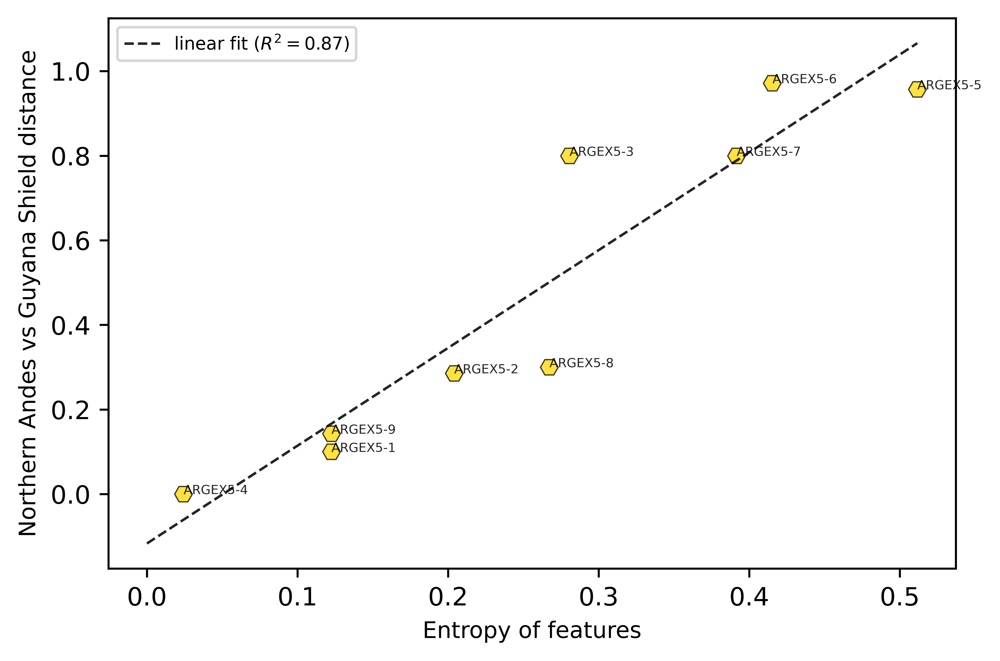

coefficient of determination: 0.9705229330655254


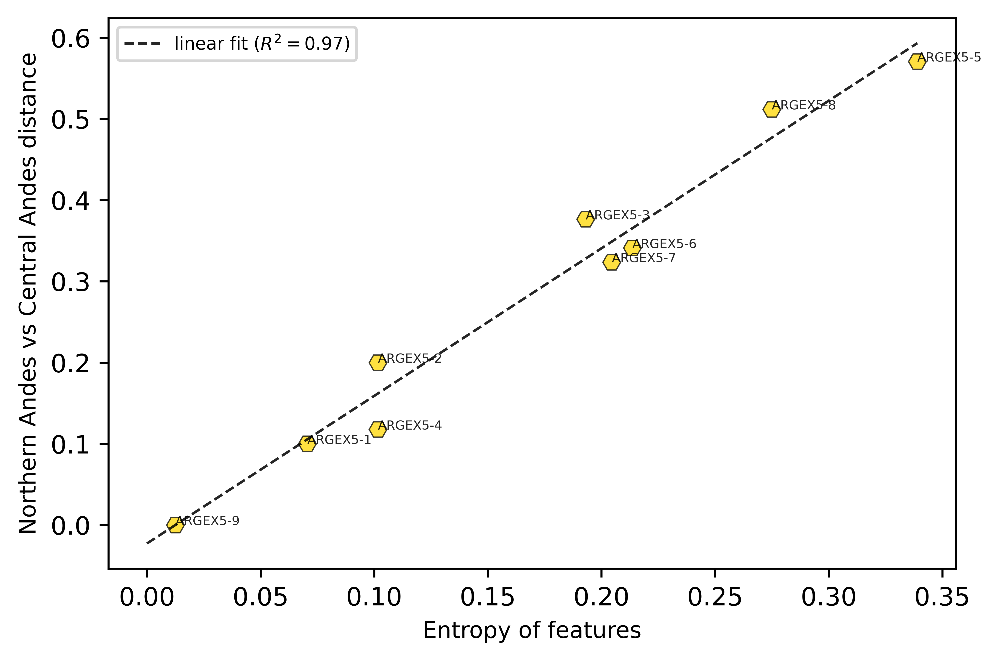

coefficient of determination: 0.911978706445574


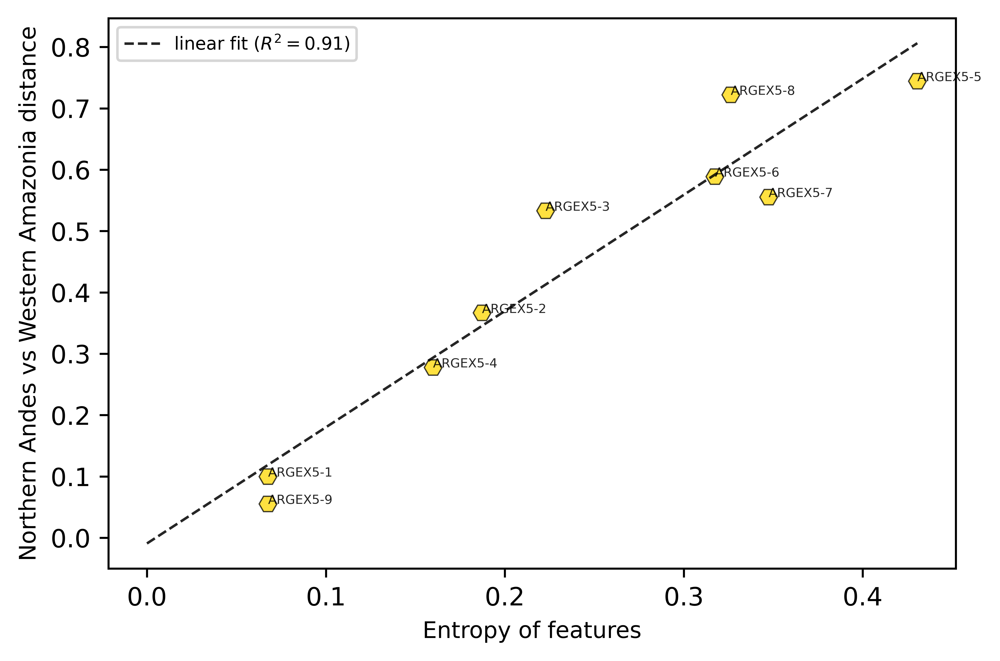

coefficient of determination: 0.759427568293806


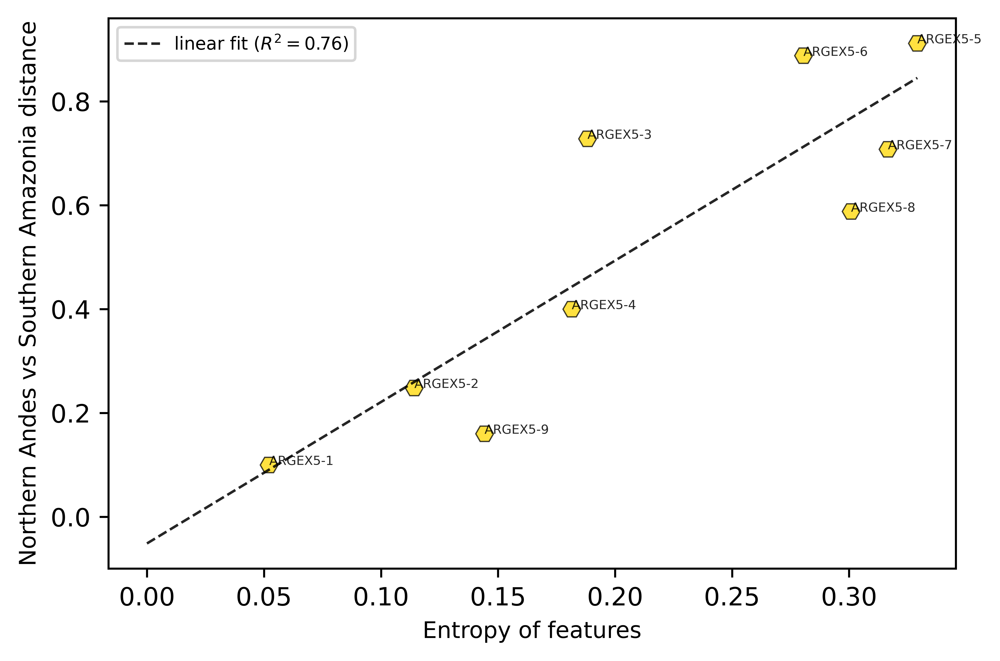

coefficient of determination: 0.7965588455742569


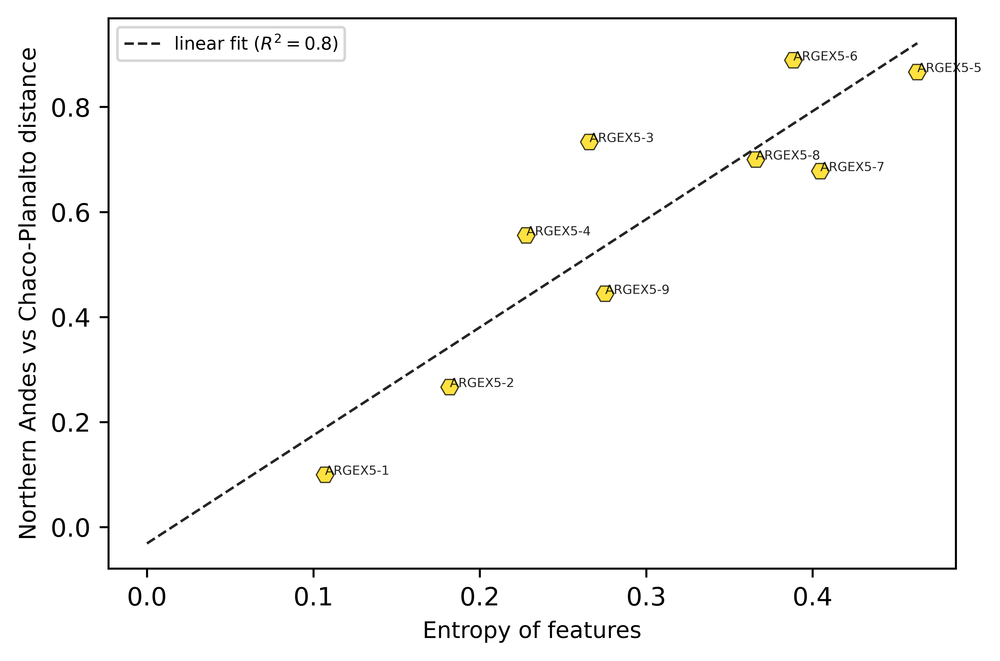

coefficient of determination: 0.9219313208601876


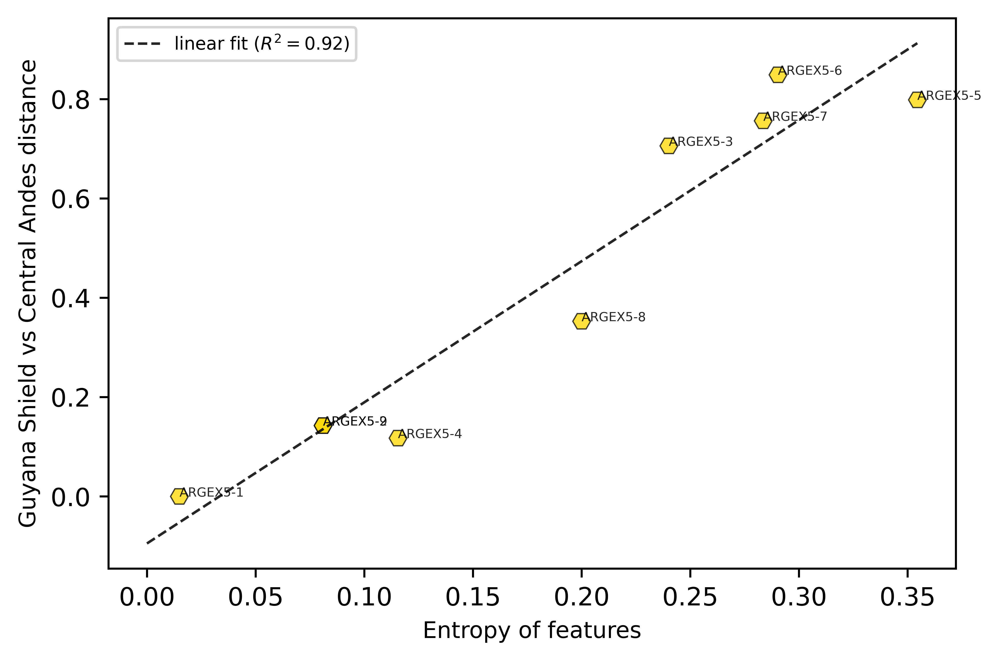

coefficient of determination: 0.9424306145418815


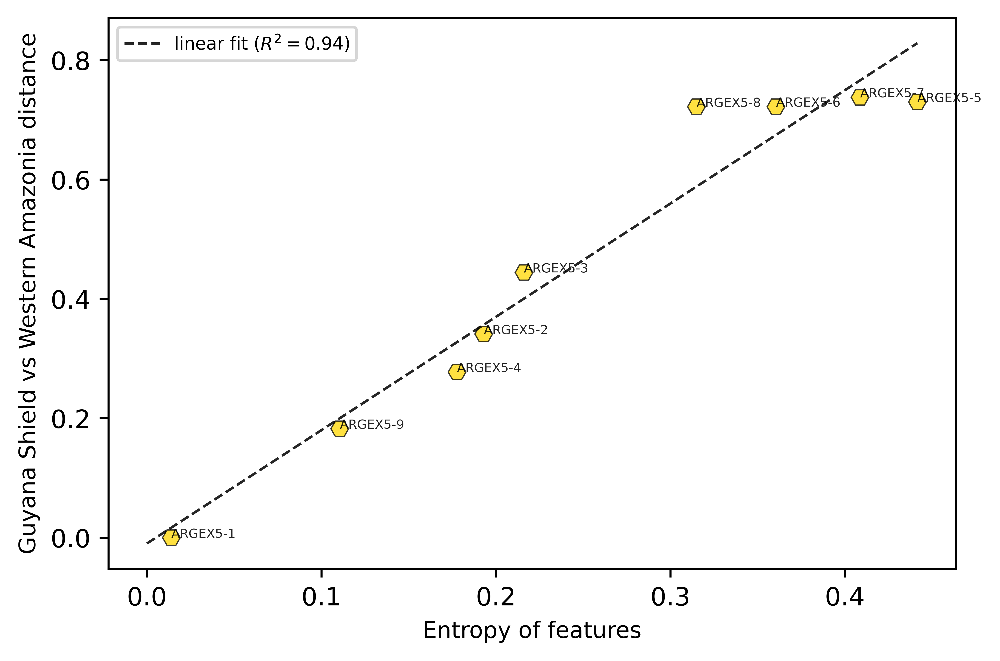

coefficient of determination: 0.9318700584293808


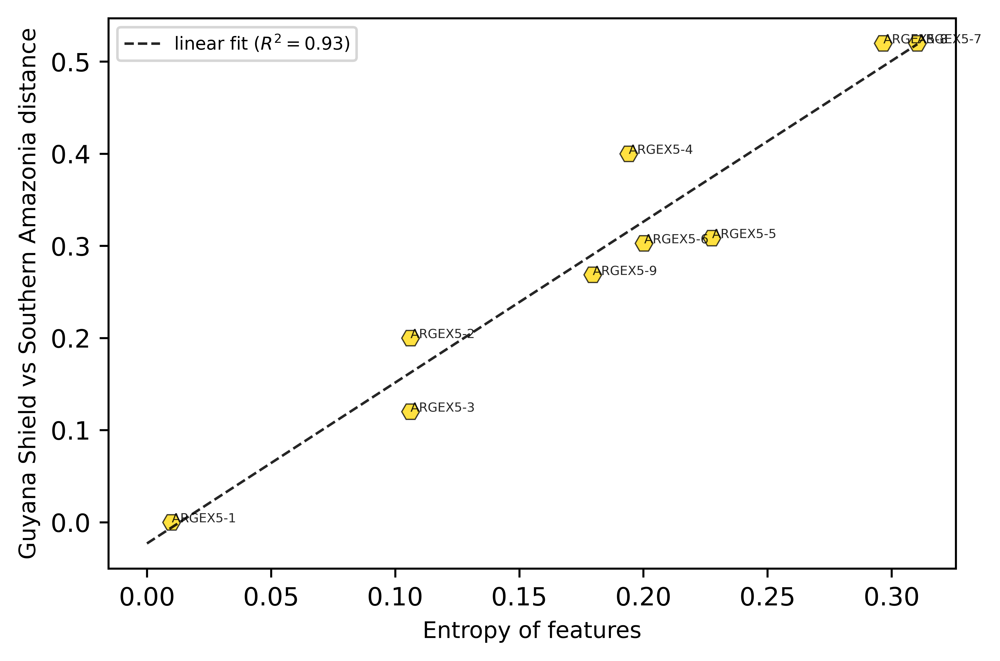

coefficient of determination: 0.6681548479461384


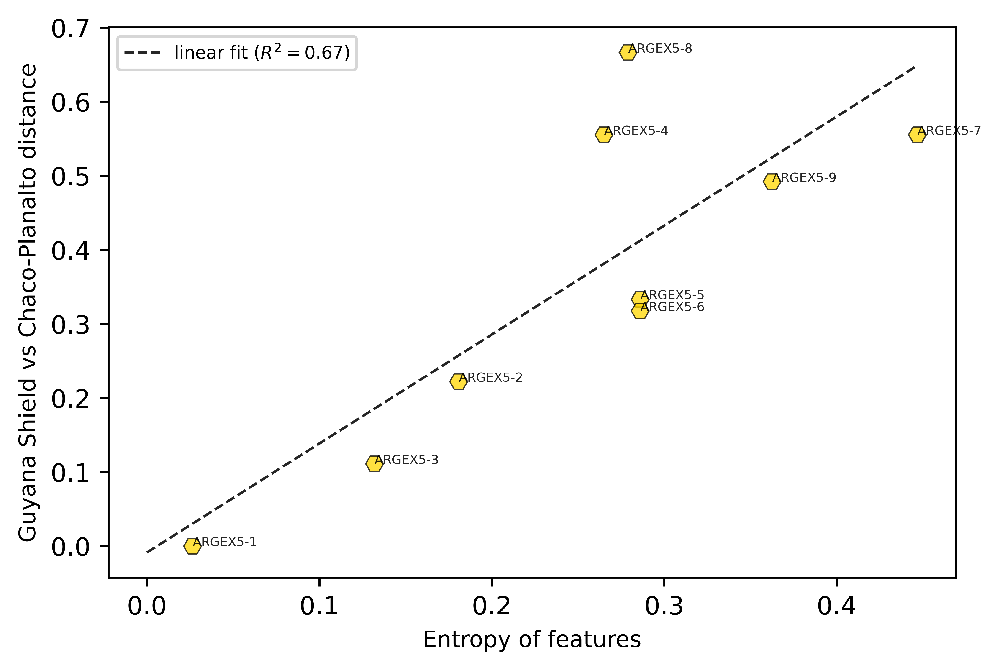

coefficient of determination: 0.9590775709103183


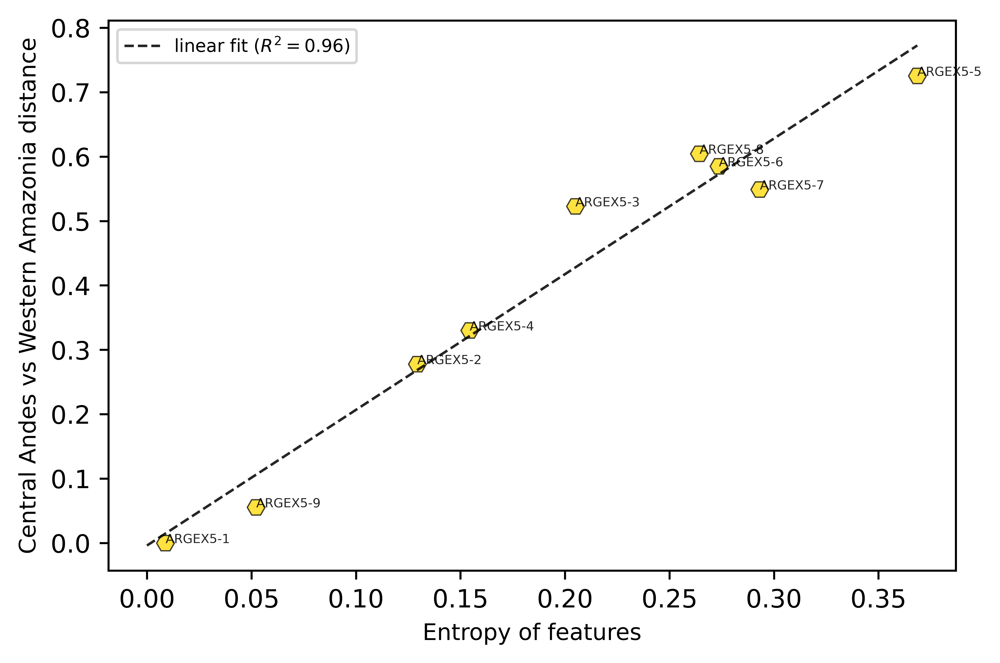

coefficient of determination: 0.8687651103101507


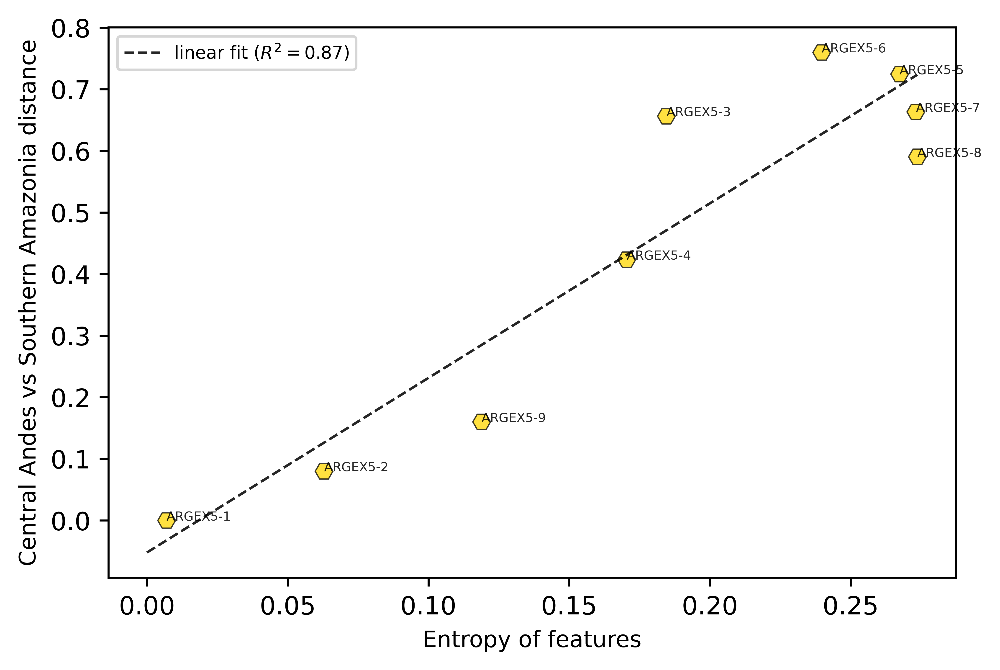

coefficient of determination: 0.9588543573075796


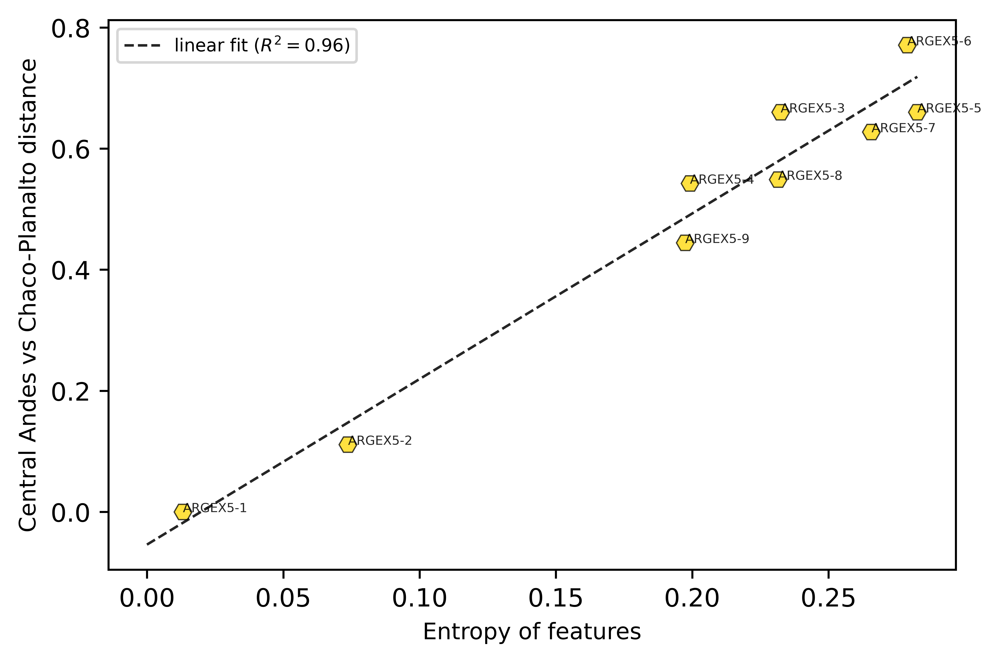

coefficient of determination: 0.9404518436496593


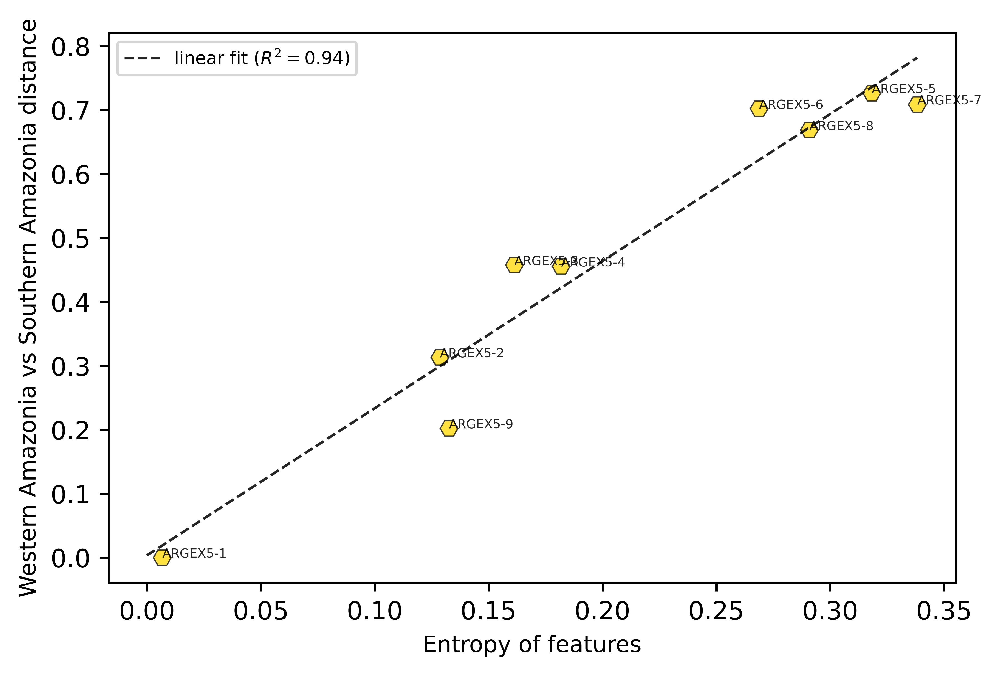

coefficient of determination: 0.9318878257584042


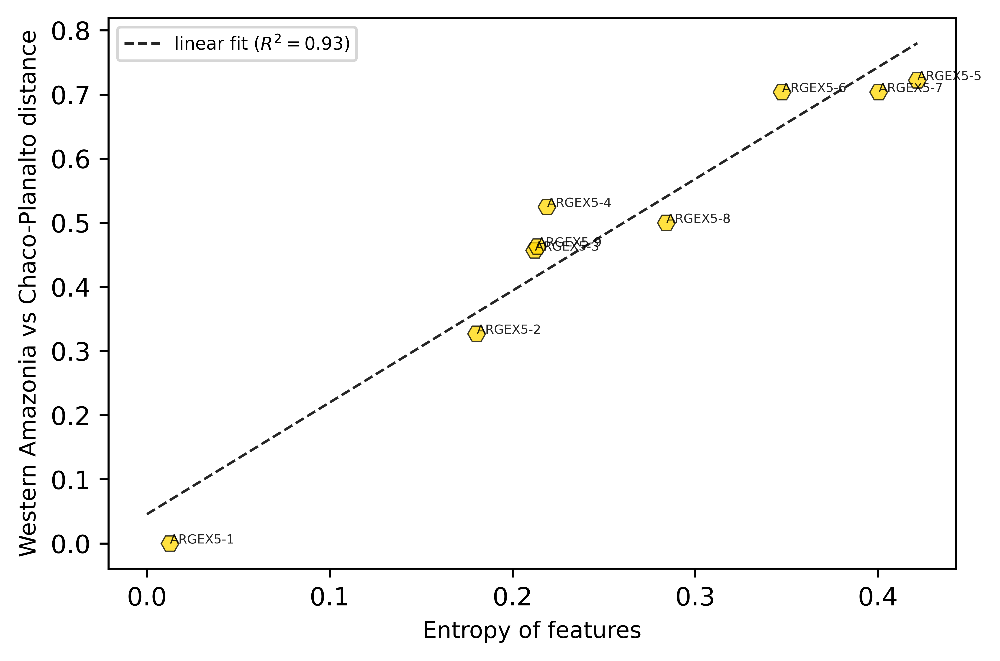

coefficient of determination: 0.908536456011288


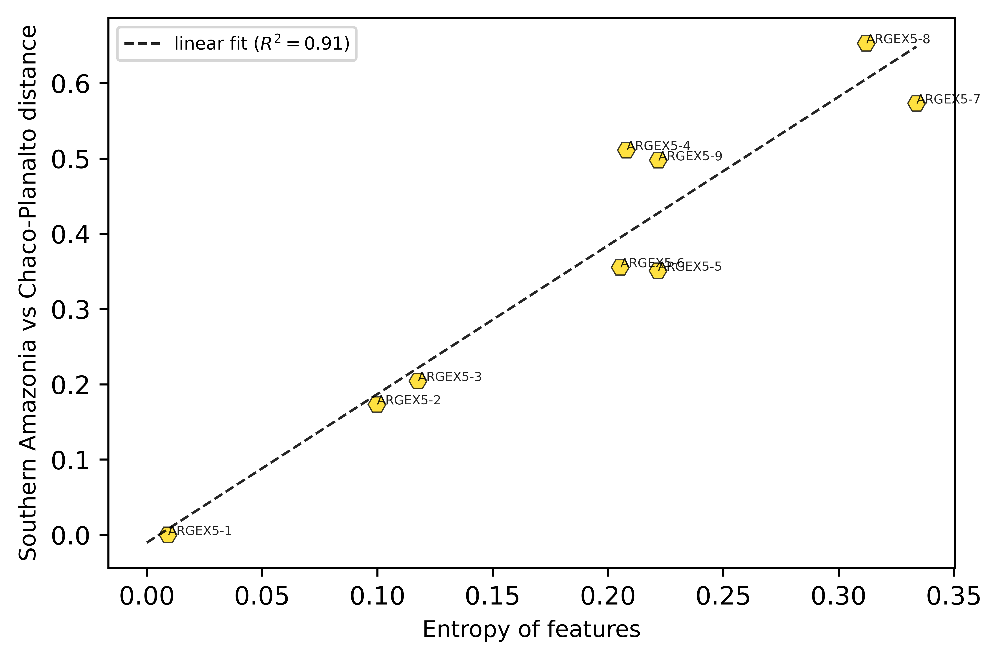

In [82]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

for pair in pairs_non:
    fig, ax = plt.subplots(dpi=800)
    X = [pairs_non_dict_entropy[feature][pair] for feature in features_pred['mapu1245'].keys()]
    Y = [pairs_non_dict_lev[feature][pair] for feature in features_pred['mapu1245'].keys()]
    
    plt.plot(X,Y,marker='H',color='gold',markersize=7,markeredgewidth=0.5,markeredgecolor='k',alpha=0.75,linewidth=0,fillstyle='full',clip_on=True)
    for feature in features_pred['mapu1245'].keys():
    
        ax.annotate(feature, color='k', xy=(pairs_non_dict_entropy[feature][pair],pairs_non_dict_lev[feature][pair]), fontsize=5, alpha=0.85)

    x = np.array(X).reshape((-1, 1))
    y = np.array(Y)
    model = LinearRegression().fit(x, y)
    r_sq = model.score(x, y)
    print('coefficient of determination:', r_sq)
    #ax.plot(X,Y,marker='x',color='k',markersize=6,markeredgewidth=1,markeredgecolor='k',alpha=0.85,linewidth=0,fillstyle='full',clip_on=True,label='Others')
    y_pred = model.predict(np.linspace(0,max(x),100).reshape((-1, 1)))
    ax.plot(np.linspace(0,max(x),100),y_pred,marker='x',color='k',markersize=0,linestyle='--',markeredgewidth=1,markeredgecolor='k',alpha=0.85,linewidth=1,fillstyle='full',clip_on=True,label=r'linear fit ($R^2 = {}$)'.format(np.round(r_sq,2)))

    #plt.grid(False)
    plt.legend(loc='best',fontsize=7)
    #plt.xticks(rotation=90)
    plt.xlabel(r'Entropy of features',fontsize=9)
    plt.ylabel(pair[0]+' vs '+pair[1]+' distance',fontsize=9)
    plt.rcParams.update({'font.size': 10})
    plt.savefig('entropyvsdistance'+pair[0]+'vs.'+pair[1]+'.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
    plt.show()

In [83]:
!pip install adjustText

  Created wheel for adjustText: filename=adjustText-0.7.3-py3-none-any.whl size=7098 sha256=8c2e392bd0fd042240c2296708cf4f489d467fb5404a67932daf1c49e9396747
  Stored in directory: /home/ec2-user/.cache/pip/wheels/70/86/f9/89161c891b07f90e2b15b5e4b6dfe70cc8f54c5ef26c0116f1
Successfully built adjustText
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [84]:
from adjustText import adjust_text

coefficient of determination: 0.8196733984682322


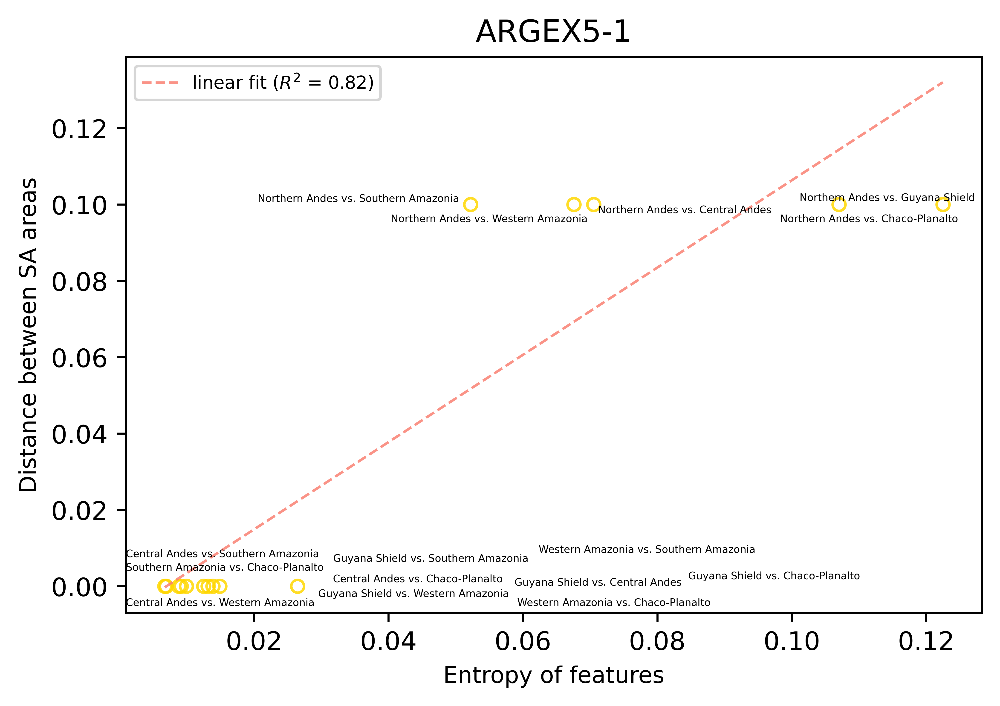

coefficient of determination: 0.7022866310254112


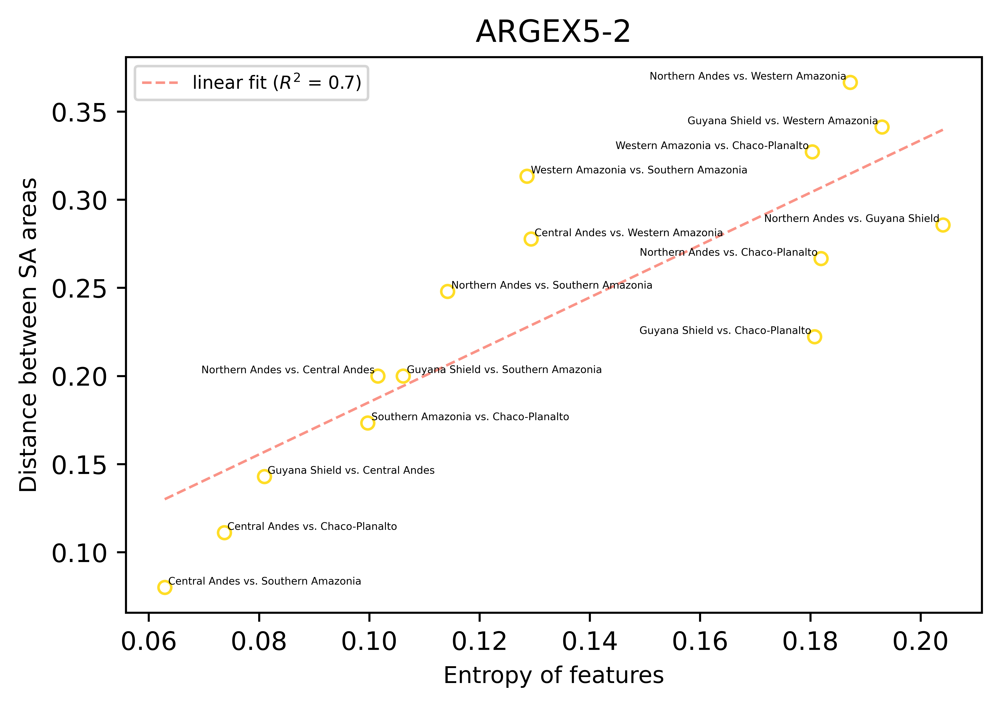

coefficient of determination: 0.7330407838139422


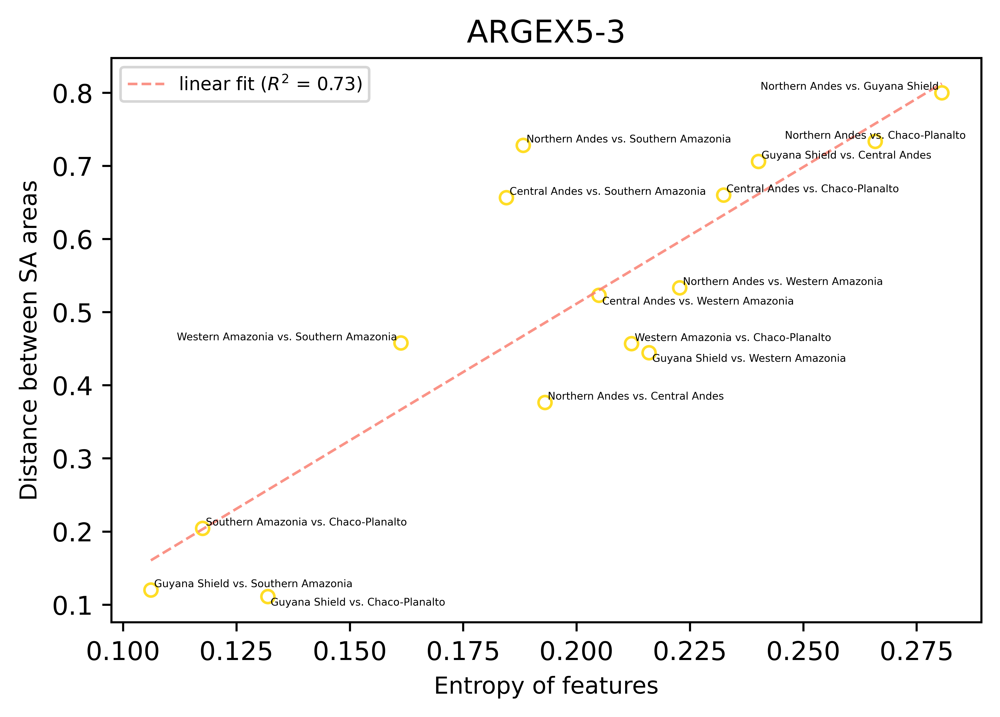

coefficient of determination: 0.8758156437850579


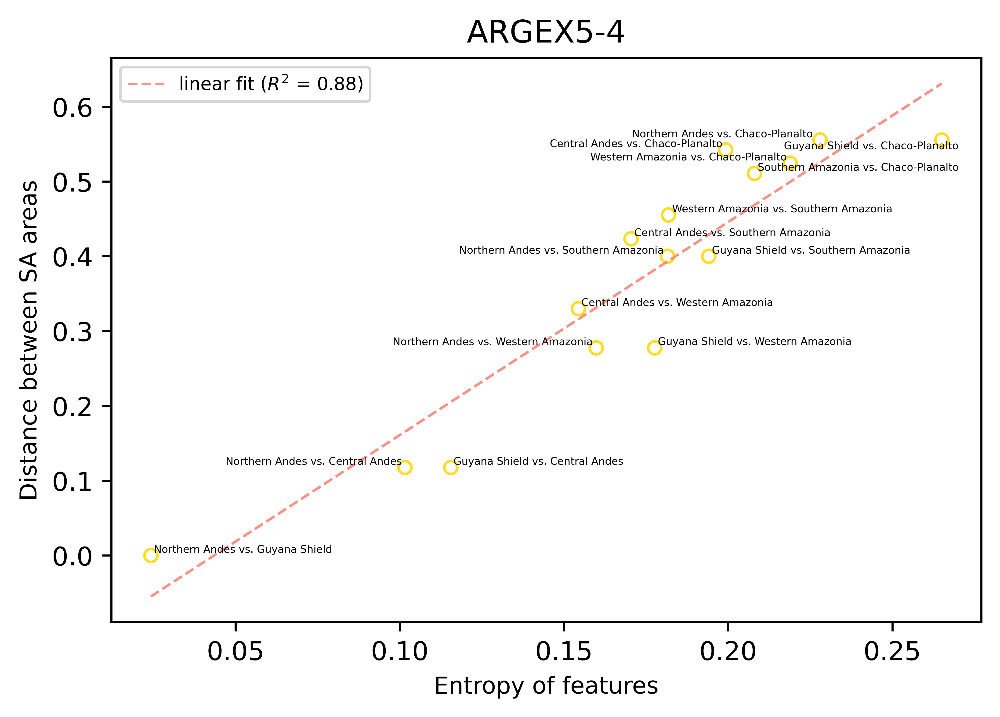

coefficient of determination: 0.5401585564047033


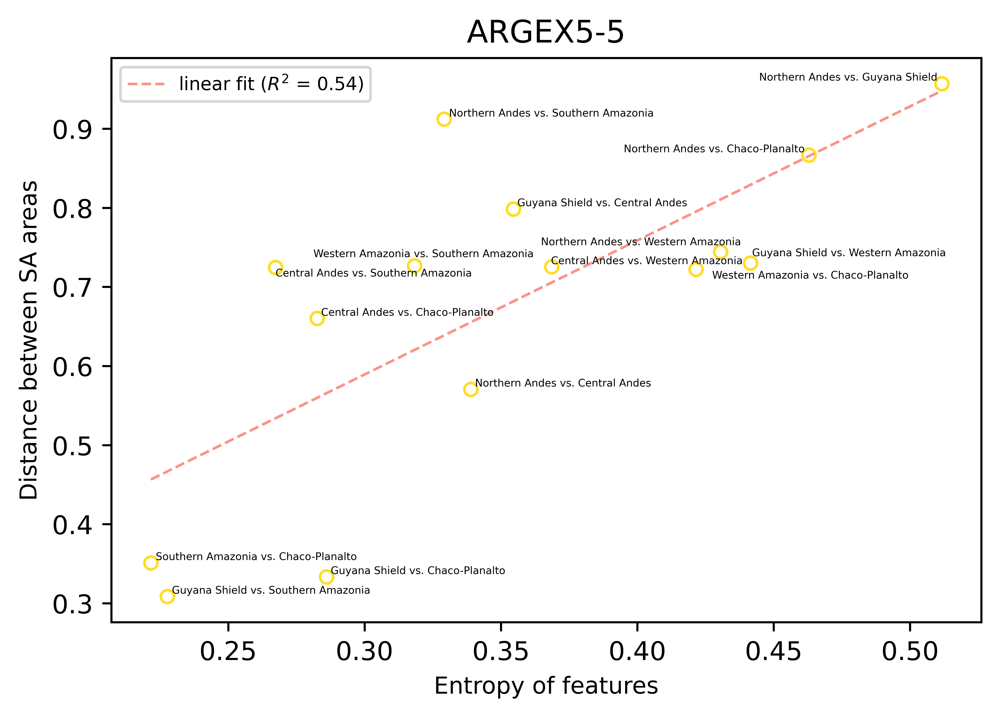

coefficient of determination: 0.4794632406110978


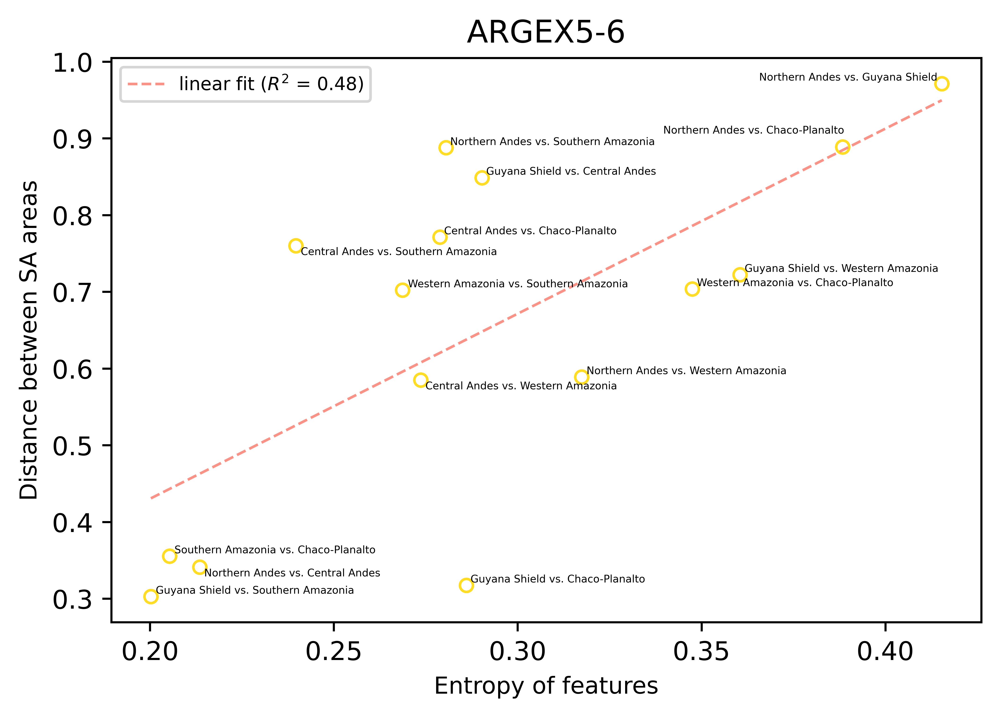

coefficient of determination: 0.2242454622021407


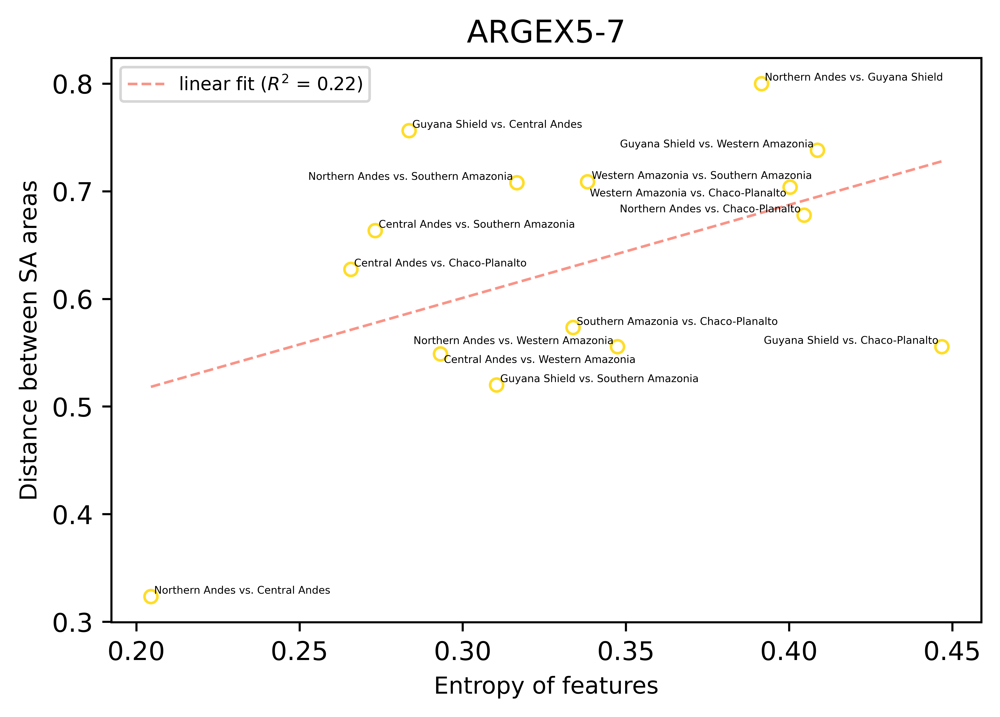

coefficient of determination: 0.4724763588348533


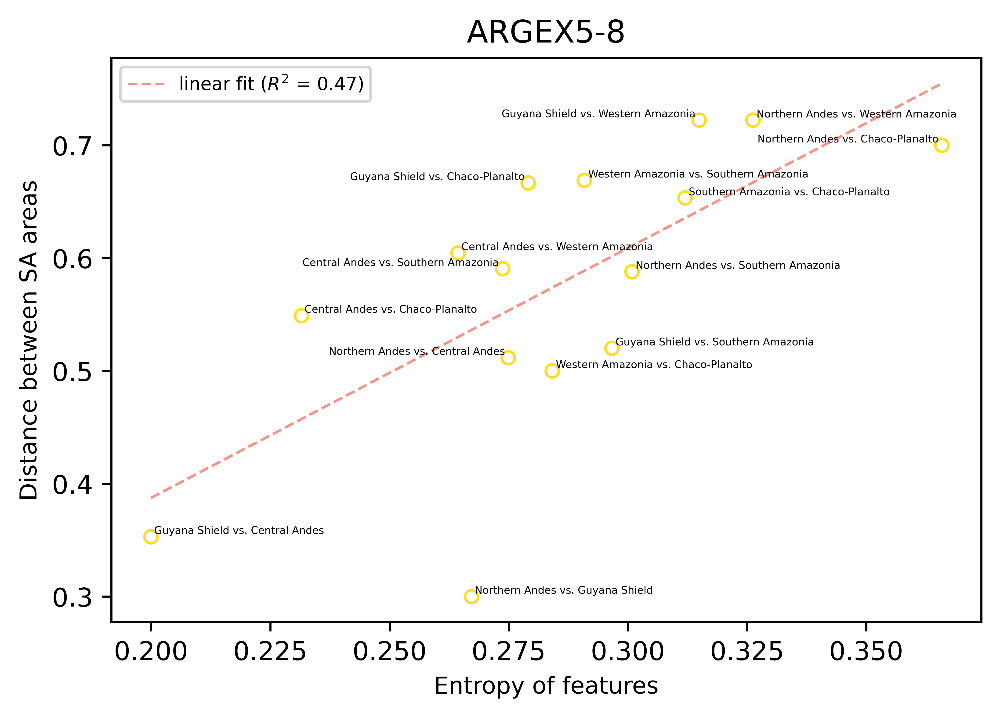

coefficient of determination: 0.8349441363589125


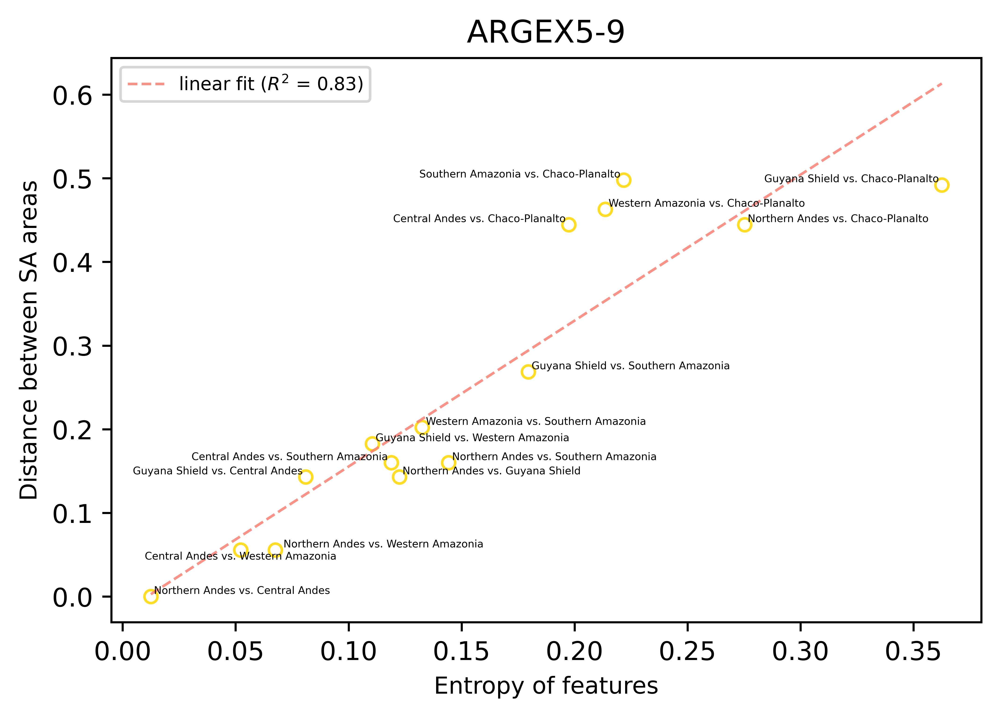

In [85]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

for feature in features_pred['mapu1245'].keys():
    fig, ax = plt.subplots(dpi=800)
    X = list(pairs_non_dict_entropy[feature].values())
    Y = list(pairs_non_dict_lev[feature].values())
    plt.plot(X,Y,marker='o',color='gold',markersize=5,linestyle='--',markeredgewidth=1,markeredgecolor='gold',alpha=0.85,linewidth=0,fillstyle='none',clip_on=True)
    texts = [plt.text(pairs_non_dict_entropy[feature][pair],pairs_non_dict_lev[feature][pair], pair[0]+' vs. '+pair[1], dict(size=4),ha='center', va='center') for pair in pairs_non]
    adjust_text(texts)
    #for pair in pairs_non:
        
    #    ax.annotate(pair[0]+' vs. '+pair[1], color='k', xy=(pairs_non_dict_entropy[feature][pair],pairs_non_dict_lev[feature][pair]), fontsize=4, alpha=0.85)

    x = np.array(X).reshape((-1, 1))
    y = np.array(Y)
    model = LinearRegression().fit(x, y)
    r_sq = model.score(x, y)
    print('coefficient of determination:', r_sq)
    #ax.plot(X,Y,marker='x',color='k',markersize=6,markeredgewidth=1,markeredgecolor='k',alpha=0.85,linewidth=0,fillstyle='full',clip_on=True,label='Others')
    y_pred = model.predict(np.linspace(min(x),max(x),100).reshape((-1, 1)))
    ax.plot(np.linspace(min(x),max(x),100),y_pred,marker='x',color='salmon',markersize=0,linestyle='--',markeredgewidth=1,markeredgecolor='k',alpha=0.85,linewidth=1,fillstyle='full',clip_on=True,label=r'linear fit ($R^2$ = {})'.format(np.round(r_sq,2)))

    #plt.grid(False)
    plt.legend(loc='best',fontsize=7)
    plt.title(feature,fontsize=12)
    plt.xlabel(r'Entropy of features',fontsize=9)
    plt.ylabel(r'Distance between SA areas',fontsize=9)
    plt.rcParams.update({'font.size': 10})
    plt.savefig('entropyvsareas_'+feature+'.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
    plt.show()

## (6) entropy x feature x birchall area

In [86]:
areas_birchall_WE = {}

for language in features_pred.keys():
    if areas_birchall[language] in ['Northern Andes','Central Andes','Western Amazonia','Southern Cone']:
        areas_birchall_WE[language]='Western SA'
    else:
        areas_birchall_WE[language]='Eastern SA'

In [87]:
## agrupamos las lenguas que tienen la misma familia

from collections import defaultdict

v = defaultdict(list)

for key, value in sorted(areas_birchall_WE.items()):
    v[value].append(key)

In [88]:
areas = dict(v)

In [89]:
D_areas = {feature:{} for feature in features_pred['mapu1245'].keys()}

for feature in features_pred['mapu1245'].keys():
    for fam in areas.keys():
        D_areas[feature][fam]=entropy_area(feature,areas[fam])/entropy(range(len(areas[fam])))

In [90]:
D_WE_areas = pd.DataFrame.from_dict(D_areas)
D_WE_areas['average entropy'] = D_WE_areas.mean(numeric_only=True, axis=1)
languages = [len(areas[fam]) for fam in D_WE_areas.index]
D_WE_areas['number of languages'] = languages

In [91]:
D_WE_areas

,ARGEX5-1,ARGEX5-2,ARGEX5-3,ARGEX5-4,ARGEX5-5,ARGEX5-6,ARGEX5-7,ARGEX5-8,ARGEX5-9,average entropy,number of languages
Western SA,0.055779,0.127743,0.183927,0.136010,0.339007,0.239533,0.250981,0.251927,0.037165,0.180230,47
Eastern SA,0.007151,0.097665,0.097665,0.187324,0.203582,0.185560,0.304788,0.278165,0.198302,0.173356,41


In [92]:
lev_features = {}

for feature in features_pred['mapu1245'].keys():
    values_features = {'Western SA':[],'Eastern SA':[]}

    for language in features_pred.keys():
        values_features[areas_birchall_WE[language]]+=[features_pred[language][feature]]
    products = itertools.product(values_features['Western SA'],values_features['Eastern SA'])
    LEN=0
    N=0
    for v1, v2 in products:
        if v1!=v2:
            LEN+=1
        N+=1
    lev_features[feature]=LEN/N#1-len(list(chain.from_iterable([(val,)*min(values_features['Western SA'].count(val), values_features['Eastern SA'].count(val)) for val in (set(values_features['Western SA']) & set(values_features['Eastern SA']))])))/min(len(values_features['Western SA']),len(values_features['Eastern SA']))#textdistance.levenshtein.distance(values_features['Western SA'],values_features['Eastern SA'])/max(len(values_features['Western SA']),len(values_features['Eastern SA']))

In [93]:
lev_features

{'ARGEX5-1': 0.0425531914893617,
 'ARGEX5-2': 0.23456149455111572,
 'ARGEX5-3': 0.5770627919045148,
 'ARGEX5-4': 0.41722885313959523,
 'ARGEX5-5': 0.7581733264141152,
 'ARGEX5-6': 0.7669953295277634,
 'ARGEX5-7': 0.6922677737415672,
 'ARGEX5-8': 0.5900363258951739,
 'ARGEX5-9': 0.233523611831863}

coefficient of determination: 0.9218230882170317


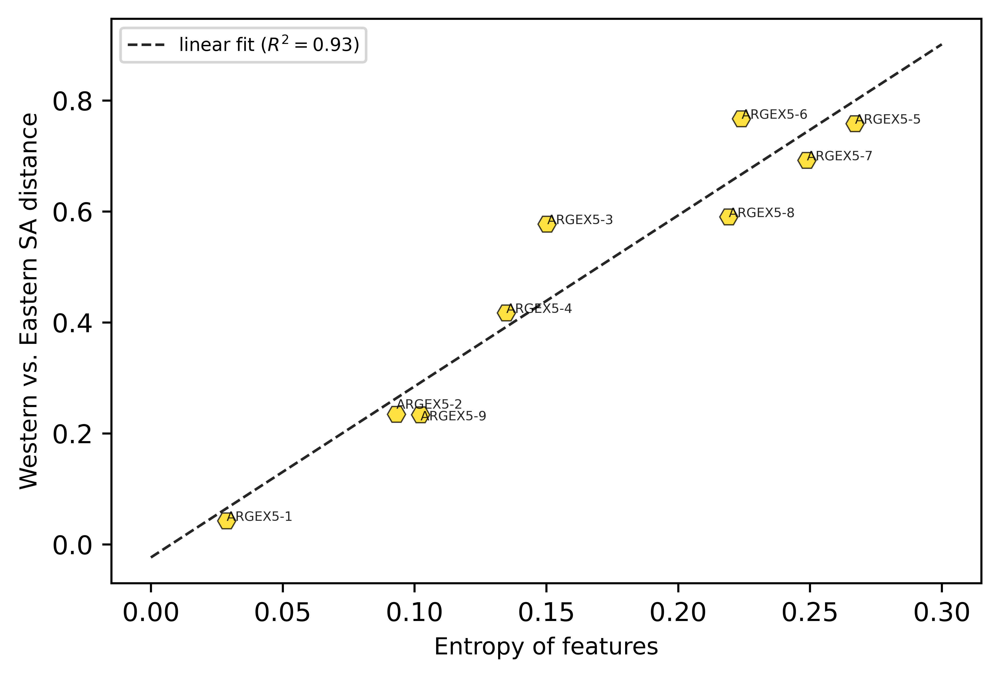

In [94]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

fig, ax = plt.subplots(dpi=800)

ax.plot([D_all_dict[key] for key in D_all_dict.keys()],[lev_features[key] for key in D_all_dict.keys()],marker='H',color='gold',markersize=7,markeredgewidth=0.5,markeredgecolor='k',alpha=0.75,linewidth=0,fillstyle='full',clip_on=True)
for feature in D_all_dict.keys():
    
    if feature!='ARGEX5-2' and feature!='ARGEX5-9':

        ax.annotate(feature, color='k', xy=(D_all_dict[feature],lev_features[feature]), fontsize=5, alpha=0.85)

    elif feature=='ARGEX5-2':
        
        ax.annotate(feature, color='k', xy=(D_all_dict[feature],lev_features[feature]+0.01), fontsize=5, alpha=0.85)

    else:
        
        ax.annotate(feature, color='k', xy=(D_all_dict[feature],lev_features[feature]-0.01), fontsize=5, alpha=0.85)

        
x = np.array([D_all_dict[key] for key in D_all_dict.keys()]).reshape((-1, 1))
y = np.array([lev_features[key] for key in D_all_dict.keys()])
model = LinearRegression().fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
#ax.plot(X,Y,marker='x',color='k',markersize=6,markeredgewidth=1,markeredgecolor='k',alpha=0.85,linewidth=0,fillstyle='full',clip_on=True,label='Others')
y_pred = model.predict(np.linspace(0,0.3,100).reshape((-1, 1)))
ax.plot(np.linspace(0,0.3,100),y_pred,marker='x',color='k',markersize=0,linestyle='--',markeredgewidth=1,markeredgecolor='k',alpha=0.85,linewidth=1,fillstyle='full',clip_on=True,label=r'linear fit ($R^2 = 0.93$)')

#plt.grid(False)
plt.legend(loc='best',fontsize=7)
#plt.xticks(rotation=90)
plt.xlabel(r'Entropy of features',fontsize=9)
plt.ylabel(r'Western vs. Eastern SA distance',fontsize=9)
plt.rcParams.update({'font.size': 10})
plt.savefig('entropyvsWE.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()